# Ejercicio No 4: Algoritmo A*


## Nombre:

###       Fernando Sanchez

## Enunciado:

### •	Diseñe un grafo similar al que se ha presentado en los ejercicios de búsqueda por amplitud y profundidad, partiendo de las siguientes coordenadas de latitud y longitud: -2.8801604,-79.0071712. Para ello deberá realizar las siguientes tareas:

    Emplear la herramienta Google Maps (R) con las coordenadas antes indicadas (Link).

In [1]:
#IMPORTAR py2neo
from py2neo import Node, Relationship, Graph


# connect to authenticated graph database
graph = Graph("bolt://localhost:7687", aut="neo4j", password="lugares", secure=False)

    Definir 11 puntos de interés (El Vecino, Bellavista, Loja Argelia, Misicata, etc.) y armar el grafo.

    11 Puntos de interes
    
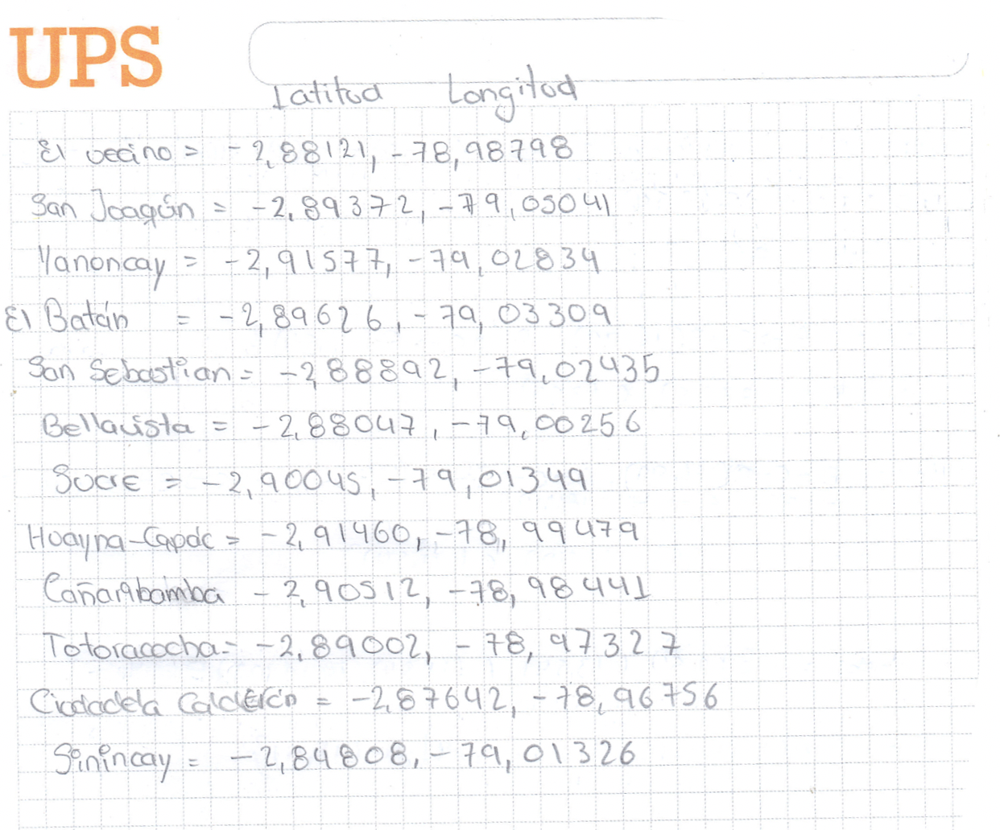

    Grafo
    
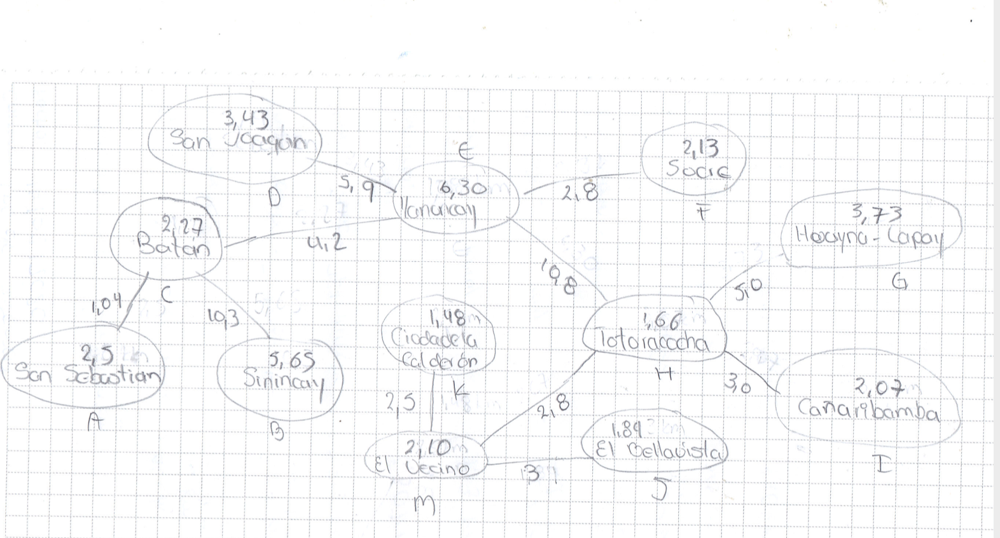

    Especificar como punto de partida al sector "San Sebastián" y como objetivo "Totoracocha".
    
        1) Punto de partida: San Sebastián"
        2) Punto objetivo: Totoracocha
        
    Estimar la distancia entre dos puntos datos usando la herramienta de regla que provee Google Maps y 
    definirla como h(n).
    
    Calcular la distancia que existe entre los puntos de interés. Para ello debe usar la "ir de un punto a 
    otro" de Google Maps (Direcciones o Indicaciones).
    
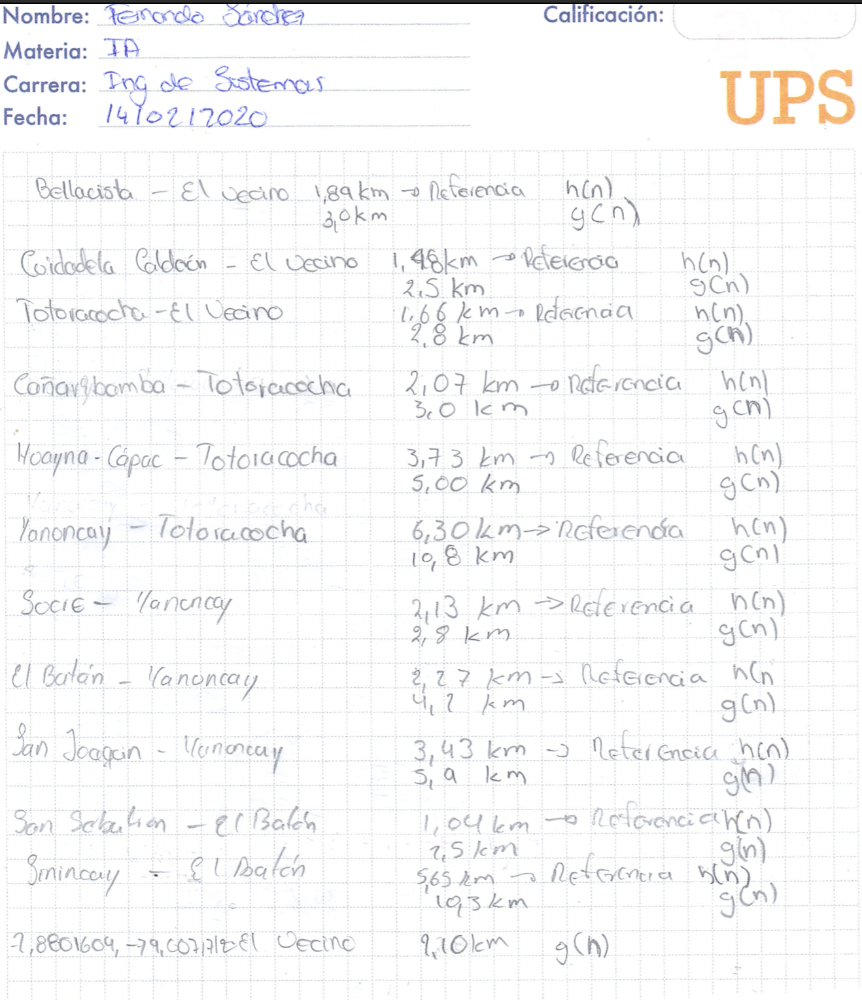

    Ejemplos:
    
   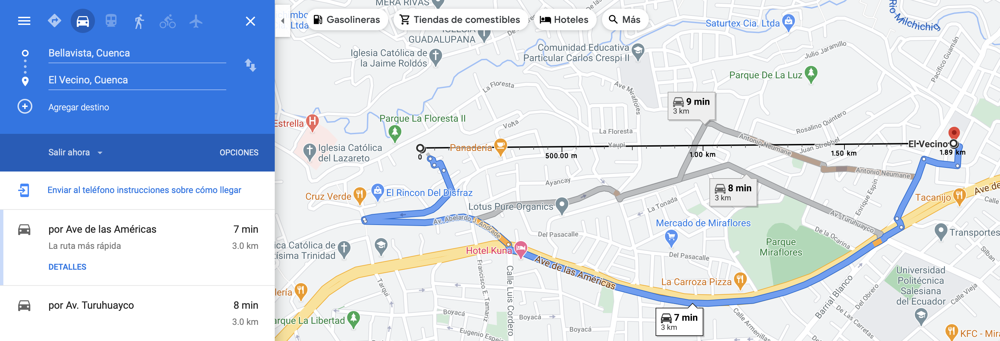
   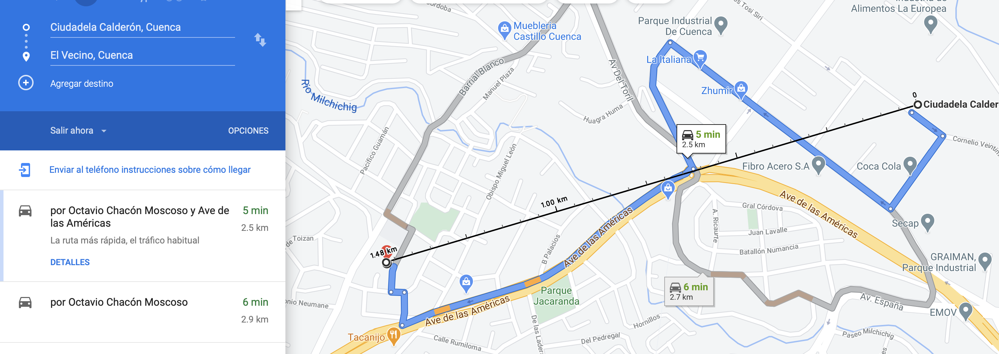
   
   
    Realizar el proceso de búsqueda de forma similar a cómo se a explicado en este apartado, almacenando para 
    ello los datos de la lista Visitados y de la Cola.

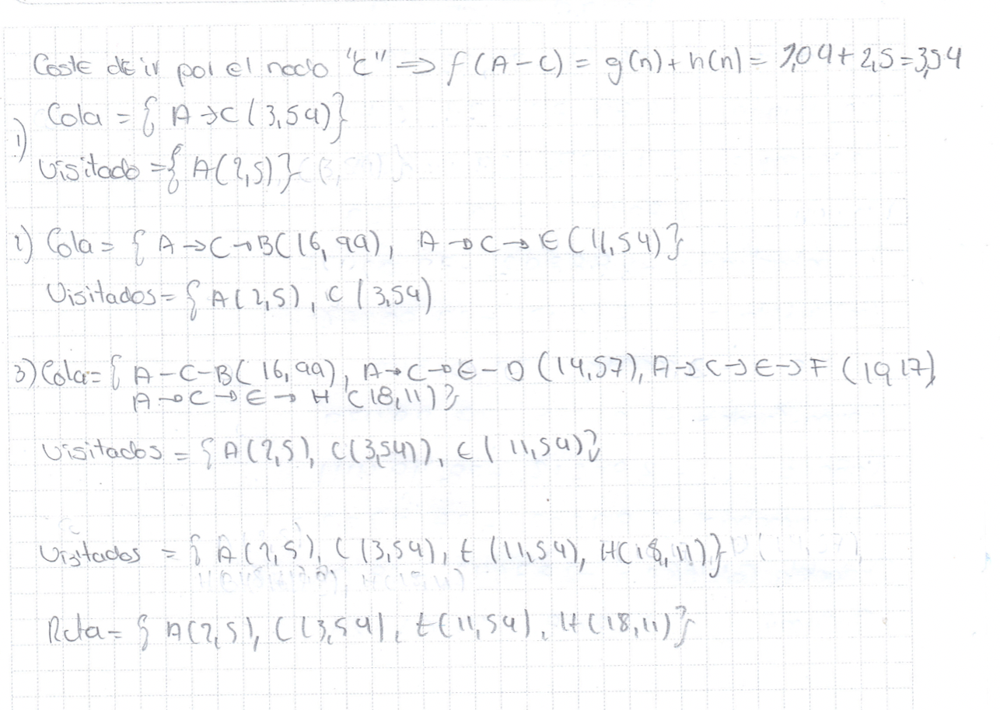

    Creacion de Nodos Lugares y con relaciones CONNECTION.

## Importar la API py2neo
    Para el ingreso de los datos que se encuentran dentro de la lista
## Conexión con Neo4j
    Configure la URL de conexión con la base de datos de Ne04j:
   ### graph = Graph("bolt://localhost:7687", aut="neo4j", password="lugares", secure=False)  
   
       Creacion de los 11 lugares con sus relaciones.

In [9]:
graph.run(" CREATE (a:Lugar {name: 'El Vecino', latitude: -2.88121, longitude: -78.98748, h: 2.10}),"+
       "(b:Lugar {name: 'San Joaquin', latitude: -2.89372, longitude: -79.05041, h: 3.43}),"+
       "(c:Lugar {name: 'Yanuncay', latitude: -2.91577, longitude: -79.02834, h: 6.30}),"+
       "(d:Lugar {name: 'El Batan',latitude: -2.89626, longitude: -79.03309, h: 2.27}),"+
       "(e:Lugar {name: 'San Sebastian',latitude: -2.88892, longitude: -79.02435, h: 2.5}),"+
       "(f:Lugar {name: 'Bellavista',latitude: -2.88047, longitude: -79.00252, h: 1.89}),"+
       "(g:Lugar {name: 'Sucre',latitude: -2.90045, longitude: -79.01349, h: 2.13}),"+
       "(h:Lugar {name: 'Huayna-Capac',latitude: -2.91460, longitude: -78.99479, h: 3.73}),"+
       "(i:Lugar {name: 'Cañaribamba',latitude: -2.90512, longitude: -78.98441, h: 2.07}),"+
       "(j:Lugar {name: 'Totoracocha',latitude: -2.89002, longitude: -78.47327, h: 1.66}),"+
       "(k:Lugar {name: 'Ciudadela Calderon',latitude: -2.87642, longitude: -78.96756, h: 1.48}),"+
       "(m:Lugar {name: 'Sinincay',latitude: -2.84808, longitude: -79.01326, h: 5.65}),"+
       "(e)-[:CONNECTION {g: 1.04}]->(d),"+
       "(m)-[:CONNECTION {g: 10.3}]->(d),"+
       "(d)-[:CONNECTION {g: 4.2}]->(c),"+
       "(b)-[:CONNECTION {g: 5.9}]->(c),"+
       "(g)-[:CONNECTION {g: 2.8}]->(c),"+
       "(j)-[:CONNECTION {g: 10.8}]->(c),"+
       "(h)-[:CONNECTION {g: 5.0}]->(j),"+
       "(i)-[:CONNECTION {g: 3.0}]->(j),"+
       "(a)-[:CONNECTION {g: 2.8}]->(j),"+
       "(f)-[:CONNECTION {g: 3.0}]->(a),"+
       "(k)-[:CONNECTION {g: 2.5}]->(a) ").data()






[]

    Consultar la creacion corecta de los nodos:
   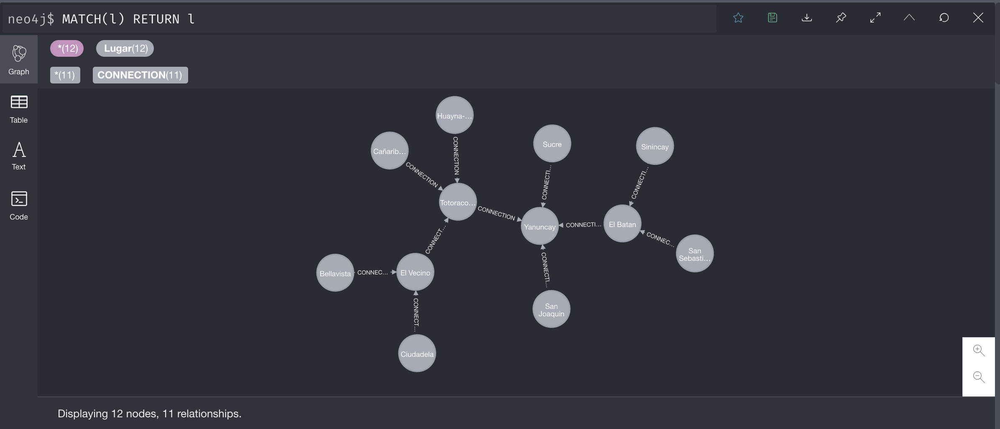

    Lo siguiente ejecutará el algoritmo y transmitirá los resultados:

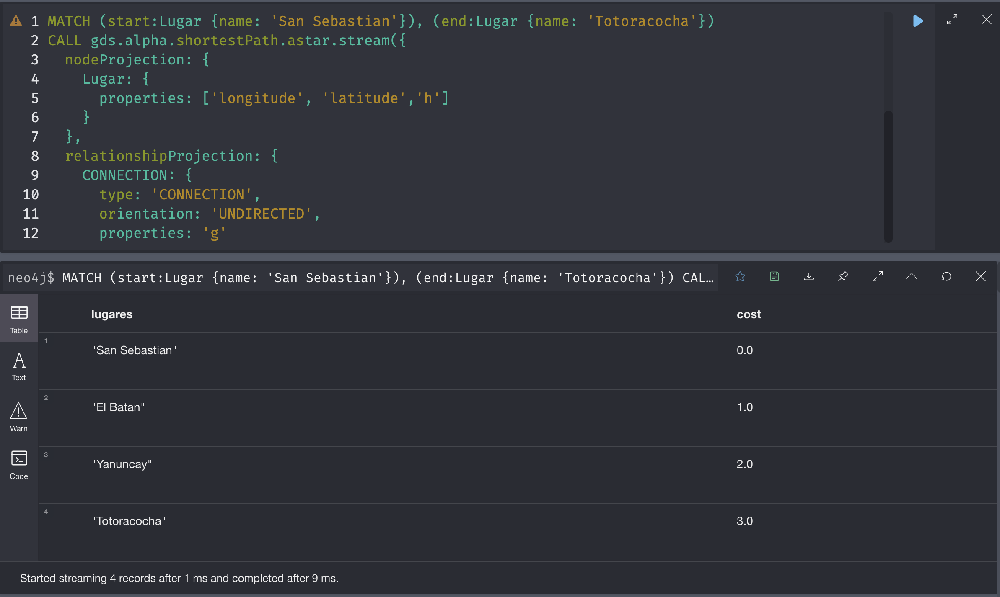

In [12]:
graph.run("MATCH (start:Lugar {name: 'San Sebastian'}), (end:Lugar {name: 'Totoracocha'})"+
"CALL gds.alpha.shortestPath.astar.stream({"+
  "nodeProjection: {"+
    "Lugar: {"+
      "properties: ['longitude', 'latitude','h']"+
    "}"+
  "},"+
  "relationshipProjection: {"+
    "CONNECTION: {"+
      "type: 'CONNECTION',"+
      "orientation: 'UNDIRECTED',"+
      "properties: 'g'"+
    "}"+
  "},"+
  "startNode: start,"+
  "endNode: end,"+
  "propertyKeyLat: 'h',"+
  "propertyKeyLon: 'h'"+
"})"+
" YIELD nodeId, cost"+
" RETURN gds.util.asNode(nodeId).name AS lugares, cost").data()

[{'lugares': 'San Sebastian', 'cost': 0.0},
 {'lugares': 'El Batan', 'cost': 1.0},
 {'lugares': 'Yanuncay', 'cost': 2.0},
 {'lugares': 'Totoracocha', 'cost': 3.0}]